### Train DNN

In [30]:
import torch
from pathlib import Path
import pickle
import numpy as np
from matplotlib import pyplot as plt
#from sklearn.model_selection import StratifiedKFold, KFold
#from sklearn.model_selection import train_test_split
import os
from torch.utils.data import Dataset, TensorDataset, DataLoader
np.random.seed(42)
torch.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


import torch.nn.functional as F
import sys
module_path = Path().resolve().parents[1] / "src" / "models"

# Append the directory to sys.path
sys.path.append(str(module_path))


from trainDNN import *
from explainDNN import *
from predictDNN import *

module_path = Path().resolve().parents[1] / "src" / "postprocessing"

# Append the directory to sys.path
sys.path.append(str(module_path))


from getModelPerformance import *

#### Load features

In [31]:
feature_path = Path().resolve().parents[1] / "data" / "interim" / "inputfeatures" / "SedTOCFeaturesnoNAN_TOC_CS_men_v2"
features = np.load(Path(feature_path / "numpy_features.npy"))
labels = np.load(Path(feature_path / "numpy_labels.npy"))
lats = np.load(Path(feature_path / "numpy_lat.npy"))
lons = np.load(Path(feature_path / "numpy_lon.npy"))
X_mean = np.load(Path(feature_path / "features_mean.npy")).astype(float)
X_std = np.load(Path(feature_path / "features_std.npy")).astype(float)


In [32]:
features.shape[1]

139

In [33]:
features

array([[2.34354608e-01, 9.99990000e+04, 5.83295768e+04, ...,
        0.00000000e+00, 0.00000000e+00, 2.75000006e-01],
       [1.60412745e-01, 9.99990000e+04, 5.28133394e+04, ...,
        0.00000000e+00, 0.00000000e+00, 5.00000007e-02],
       [9.81667696e-02, 9.99990000e+04, 8.34024000e+04, ...,
        0.00000000e+00, 0.00000000e+00, 5.00000007e-02],
       ...,
       [1.26698812e+00, 1.36908578e+00, 9.99990000e+04, ...,
        0.00000000e+00, 0.00000000e+00, 5.00000007e-02],
       [1.26698812e+00, 1.36908578e+00, 9.99990000e+04, ...,
        0.00000000e+00, 0.00000000e+00, 5.00000007e-02],
       [1.26698812e+00, 1.36908578e+00, 9.99990000e+04, ...,
        0.00000000e+00, 0.00000000e+00, 5.00000007e-02]])

#### Define the neural network architecture

In [34]:
loss_fn = torch.nn.MSELoss()

In [35]:
class DNN(torch.nn.Module):
    def __init__(self, layer_width):
        super(DNN, self).__init__()

        self.do_prob = 0
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(features.shape[1], layer_width[0]),
            torch.nn.BatchNorm1d(layer_width[0]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[0], layer_width[1]),
            torch.nn.BatchNorm1d(layer_width[1]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[1], layer_width[2]),
            torch.nn.BatchNorm1d(layer_width[2]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[2], layer_width[3]),
            torch.nn.BatchNorm1d(layer_width[3]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[3], layer_width[4]),
            torch.nn.BatchNorm1d(layer_width[4]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[4], layer_width[5]),
            torch.nn.BatchNorm1d(layer_width[5]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[5], layer_width[6]),
            torch.nn.BatchNorm1d(layer_width[6]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),

        )

        self.decoder = torch.nn.Sequential(
            # torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[6], layer_width[5]),
            #torch.nn.BatchNorm1d(layer_width[5]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[5], layer_width[4]),
            #torch.nn.BatchNorm1d(layer_width[4]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[4], layer_width[3]),
            #torch.nn.BatchNorm1d(layer_width[3]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[3], layer_width[2]),
            #torch.nn.BatchNorm1d(layer_width[2]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[2], layer_width[1]),
            #torch.nn.BatchNorm1d(layer_width[1]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[1], layer_width[0]),
            #torch.nn.BatchNorm1d(layer_width[0]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[0], features.shape[1])
        )

        self.supervised = torch.nn.Sequential(
            torch.nn.Linear(layer_width[6], layer_width[7]),
            torch.nn.BatchNorm1d(layer_width[7]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[7], layer_width[8]),
            torch.nn.BatchNorm1d(layer_width[8]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[8], layer_width[9]),
            torch.nn.BatchNorm1d(layer_width[9]),
            torch.nn.ReLU(),
            torch.nn.Dropout(self.do_prob),
            torch.nn.Linear(layer_width[9], 1),

        )
        
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        targets = self.supervised(encoded)
        #return decoded, targets
        return targets
        
def initialize_weights(m):

    if isinstance(m, torch.nn.Linear):
        torch.nn.init.kaiming_normal_(m.weight.data)
        torch.nn.init.constant_(m.bias.data, 0)

"""
# torch.nn.Dropout(self.do_prob),
torch.nn.Linear(layer_width[6], layer_width[5]),
#torch.nn.BatchNorm1d(layer_width[5]),
torch.nn.ReLU(),
torch.nn.Dropout(self.do_prob),
torch.nn.Linear(layer_width[5], layer_width[4]),
#torch.nn.BatchNorm1d(layer_width[4]),
torch.nn.ReLU(),
torch.nn.Dropout(self.do_prob),
torch.nn.Linear(layer_width[4], layer_width[3]),
#torch.nn.BatchNorm1d(layer_width[3]),
torch.nn.ReLU(),
torch.nn.Dropout(self.do_prob),
torch.nn.Linear(layer_width[3], layer_width[2]),
#torch.nn.BatchNorm1d(layer_width[2]),
torch.nn.ReLU(),
torch.nn.Dropout(self.do_prob),
"""

'\n# torch.nn.Dropout(self.do_prob),\ntorch.nn.Linear(layer_width[6], layer_width[5]),\n#torch.nn.BatchNorm1d(layer_width[5]),\ntorch.nn.ReLU(),\ntorch.nn.Dropout(self.do_prob),\ntorch.nn.Linear(layer_width[5], layer_width[4]),\n#torch.nn.BatchNorm1d(layer_width[4]),\ntorch.nn.ReLU(),\ntorch.nn.Dropout(self.do_prob),\ntorch.nn.Linear(layer_width[4], layer_width[3]),\n#torch.nn.BatchNorm1d(layer_width[3]),\ntorch.nn.ReLU(),\ntorch.nn.Dropout(self.do_prob),\ntorch.nn.Linear(layer_width[3], layer_width[2]),\n#torch.nn.BatchNorm1d(layer_width[2]),\ntorch.nn.ReLU(),\ntorch.nn.Dropout(self.do_prob),\n'

In [36]:

layer_widths = [128, 128, 128, 128, 128, 128, 128, 128, 128, 128]  # Define your desired layer widthsmodel = DNN(layer_widths)#DNN(input_dim, layer_widths)
model = DNN(layer_widths)#DNN(input_dim, layer_widths)
model.apply(initialize_weights)
model.double()


DNN(
  (encoder): Sequential(
    (0): Linear(in_features=139, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0, inplace=False)
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0, inplace=False)
    (8): Linear(in_features=128, out_features=128, bias=True)
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0, inplace=False)
    (12): Linear(in_features=128, out_features=128, bias=True)
    (13): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0, inplace=False)
    (16): Linear(in_features=128, out_features=128, bias=True)
    (17): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_st

In [37]:
model = DNN(layer_widths)
model = model.double()
model.apply(initialize_weights)

torch.manual_seed(42)

In [38]:
"""
#time intensive operation(better save processed features and labels, after first run)
features, labels, lats, lons = preprocess_features_labels(features, labels, lats, lons, X_mean, X_std) 
np.save("preprocessed/features_CS", features)
np.save("preprocessed/labels_CS", labels)
np.save("preprocessed/lats_CS", lats)
np.save("preprocessed/lons_CS", lons)
"""

'\n#time intensive operation(better save processed features and labels, after first run)\nfeatures, labels, lats, lons = preprocess_features_labels(features, labels, lats, lons, X_mean, X_std) \nnp.save("preprocessed/features_CS", features)\nnp.save("preprocessed/labels_CS", labels)\nnp.save("preprocessed/lats_CS", lats)\nnp.save("preprocessed/lons_CS", lons)\n'

In [39]:
features_CS = np.load("preprocessed/features_CS.npy")
labels_CS = np.load("preprocessed/labels_CS.npy")
features_DO = np.load("preprocessed/features_DO.npy")
labels_DO = np.load("preprocessed/labels_DO.npy")

In [40]:
features_CS.shape

(14256, 139)

In [41]:
features_DO.shape

(6869, 139)

In [42]:
features = np.concatenate([features_CS, features_DO], axis = 0)
labels = np.concatenate([labels_CS, labels_DO], axis = 0)

In [43]:
features = torch.tensor(features)
labels = torch.tensor(labels)

In [44]:
trainloader, testloader = create_train_test_loader(features, labels, batch_size = 500, test_size_ratio=1/7, shuffle=True)

Train data size
18108
Test data size
3017


In [45]:
"""
print(f"Model structure: {model}\n\n")

for name, param in model.named_parameters():
    print(f"Layer: {name} | Size: {param.size()} | Values : {param[:2]} \n")
"""

'\nprint(f"Model structure: {model}\n\n")\n\nfor name, param in model.named_parameters():\n    print(f"Layer: {name} | Size: {param.size()} | Values : {param[:2]} \n")\n'

In [46]:
# if there is a pretrained model, this can be used
"""
path = Path().resolve().parents[1] / "models" / "supervisedmodel_TOC_noconstraint_CS.pth"
state_dict = torch.load(path)
model.load_state_dict(state_dict)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') #'cuda:0' if torch.cuda.is_available() else 
#print(physical_devices)
model.to(device)
model.double()
"""

'\npath = Path().resolve().parents[1] / "models" / "supervisedmodel_TOC_noconstraint_CS.pth"\nstate_dict = torch.load(path)\nmodel.load_state_dict(state_dict)\ndevice = torch.device(\'cuda:0\' if torch.cuda.is_available() else \'cpu\') #\'cuda:0\' if torch.cuda.is_available() else \n#print(physical_devices)\nmodel.to(device)\nmodel.double()\n'

In [47]:
# GPU intensive operation!!
num_epochs = 500
training_accuracy, training_losses, training_mae, learning_rate, evaluation_losses, evaluation_mae, true_labels, pred_labels =  train_model(model, loss_fn, trainloader, testloader, num_epochs = num_epochs)

epoch: 0 | Training Loss: 0.874 | MAE: 0.464 | LR: 0.0100000 |
epoch: 0 | Testing Loss: 1.136 | MAE: 0.540  |

epoch: 1 | Training Loss: 0.502 | MAE: 0.325 | LR: 0.0100000 |
epoch: 1 | Testing Loss: 0.479 | MAE: 0.311  |

epoch: 2 | Training Loss: 0.485 | MAE: 0.313 | LR: 0.0100000 |
epoch: 2 | Testing Loss: 0.359 | MAE: 0.285  |

epoch: 3 | Training Loss: 0.481 | MAE: 0.306 | LR: 0.0080000 |
epoch: 3 | Testing Loss: 0.324 | MAE: 0.265  |

epoch: 4 | Training Loss: 0.472 | MAE: 0.302 | LR: 0.0064000 |
epoch: 4 | Testing Loss: 0.312 | MAE: 0.275  |

epoch: 5 | Training Loss: 0.413 | MAE: 0.282 | LR: 0.0064000 |
epoch: 5 | Testing Loss: 0.328 | MAE: 0.275  |

epoch: 6 | Training Loss: 0.429 | MAE: 0.287 | LR: 0.0064000 |
epoch: 6 | Testing Loss: 0.434 | MAE: 0.299  |

epoch: 7 | Training Loss: 0.414 | MAE: 0.281 | LR: 0.0051200 |
epoch: 7 | Testing Loss: 0.471 | MAE: 0.296  |

epoch: 8 | Training Loss: 0.363 | MAE: 0.266 | LR: 0.0051200 |
epoch: 8 | Testing Loss: 0.370 | MAE: 0.287  |

e

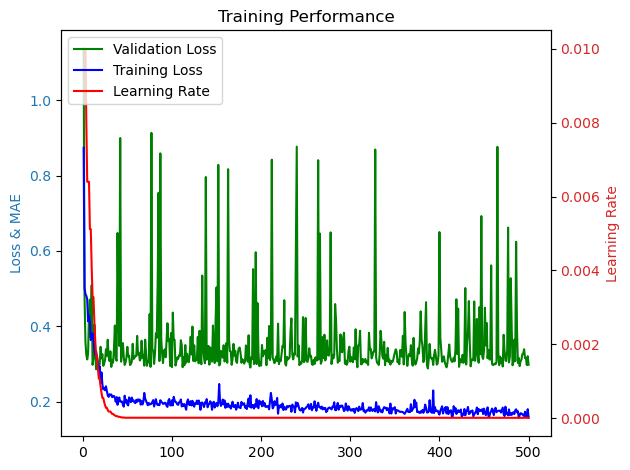

In [48]:
torch.manual_seed(42)
plot_model_performance(num_epochs,  evaluation_losses[-500:], training_losses[-500:], learning_rate[-500:])

In [49]:
output_path = Path().resolve().parents[1] / "data" / "output" / "scatterplots_TOC" / "scatter_plot_TOC_entire.png"
output_path = str(output_path)
test_labels, test_targets = evaluate_model(model, testloader, output_path)

(3017,)
(3017,)
correlation coefficient:
0.8222823739705662
mae:
0.23900726364679273
mse:
0.3375197324413944
rmse:
0.5809644846644194


In [50]:

#lats = np.load("lats_CS.npy")
#lons = np.load("lons_CS.npy")
all_labels, all_targets =  evaluate_all_predictions(model, features, labels, output_path)


correlation coefficient:
0.930397354590549
mae:
0.17540700797607692
mse:
0.1689022050957836
rmse:
0.4109771345169748


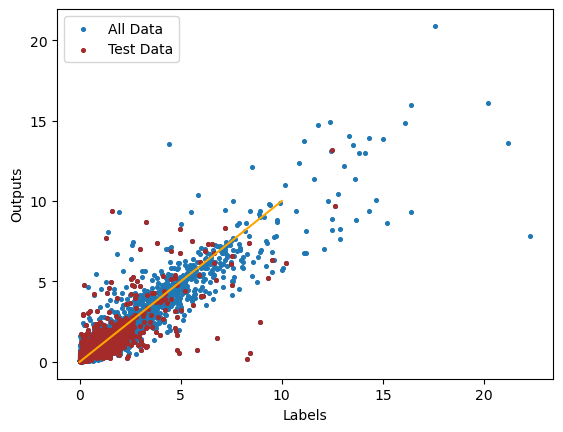

In [52]:
# Scatter plot with different colors for test labels and test targets
plt.scatter(all_labels, all_targets, label='All Data', s= 7)
plt.scatter(test_labels, test_targets, label='Test Data', color='brown', s=7)  # Add this line

line = np.linspace(0, 10, 100)

# Plot the reference line
plt.plot(line, line, 'orange')

# Set labels and title
plt.xlabel("Labels")
plt.ylabel("Outputs")

# Add legend
plt.legend()

In [53]:
#torch.save(model.state_dict(), path = Path().resolve().parents[1] / "models" / "supervisedmodel_TOC_noconstraint_CS.pth")

In [54]:
#"""
np.save("all_labels_NN_entire", all_labels)
np.save("all_predictions_NN_entire", all_targets)
np.save("test_labels_NN_entire", test_labels)
np.save("test_predictions_NN_entire", test_targets)
#"""

### Predict using the trained DNN

In [55]:
import torch
from pathlib import Path
import pickle
import numpy as np
from matplotlib import pyplot as plt
import os
import gc
from os import walk  


feature_path = path = Path().resolve().parents[1] / "data" / "interim" / "inputfeatures" / "SedTOCFeaturesnoNAN_TOC_CS_men_v2"
X_mean = np.load(Path(feature_path / "features_mean.npy")).astype(float)
X_std = np.load(Path(feature_path / "features_std.npy")).astype(float)

dataset_path = Path().resolve().parents[1] / "data" / "interim" / "worldfeatures" / "WorldFeaturesAllnoNaN_SedTOC"

files = []

for (dirpath, dirnames, filenames) in walk(dataset_path):
    files.extend(filenames)
    break

files.sort()


features = np.load(Path(dataset_path / files[0]))
prediction_sum_save = Path().resolve().parents[1] / "data" / "interim" / "predictions" / "predictions_entire"

In [56]:


model.eval()
enable_dropout(model) #for mc dropout


np.random.seed(42)
torch.manual_seed(42)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') #'cuda:0' if torch.cuda.is_available() else 
#print(physical_devices)
model.to(device)
model.double()


DNN(
  (encoder): Sequential(
    (0): Linear(in_features=139, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0, inplace=False)
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0, inplace=False)
    (8): Linear(in_features=128, out_features=128, bias=True)
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0, inplace=False)
    (12): Linear(in_features=128, out_features=128, bias=True)
    (13): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0, inplace=False)
    (16): Linear(in_features=128, out_features=128, bias=True)
    (17): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_st

In [57]:
features = np.load(Path(dataset_path / files[0]))

chunk_shape = [6,4320] #360 chunks


first_run = True
ii = 0

for count, file in enumerate(files):
    #if count > 2:
    #    break
    features = np.load(Path(dataset_path / file))
    features = np.divide((features - X_mean), X_std)

    features = torch.tensor(features)
    features = features.to(device)

    # Perform multiple forward passes with dropout
    num_samples = 100  # number of monte carlo forward passes: gives us the number of predictions or the size of the prediction ensemble
    predictions_sum = np.zeros((num_samples, chunk_shape[0], chunk_shape[1]))

    with torch.no_grad():
        for i in range(num_samples):
            predictions = model(features)
         
            # Store predictions for later averaging
            predictions_sum[i] = predictions.cpu().detach().numpy().reshape(chunk_shape)

    # Average predictions over all samples
    predictions_avg = np.mean(predictions_sum, axis=0)
    predictions_var = np.var(predictions_sum, axis=0)
    save_path = os.path.join(prediction_sum_save , f'predictions_sum_{ii}.npy')
    np.save(save_path, predictions_sum)
    #fit_params, failed_fits, failed_fit_details = fit_gaussian_to_predictions(predictions_sum)
    #print(failed_fits)

    if first_run:
        prediction_map2 = predictions_avg
        prediction_map2_var = predictions_var
        first_run = False
    else:
        prediction_map2 = np.append(prediction_map2, predictions_avg, axis=0)
        prediction_map2_var = np.append(prediction_map2_var, predictions_var, axis=0)

    ii += 1
    print("Prediction " + str(ii) + " done!")

    del features
    gc.collect()
    


Prediction 1 done!
Prediction 2 done!
Prediction 3 done!
Prediction 4 done!
Prediction 5 done!
Prediction 6 done!
Prediction 7 done!
Prediction 8 done!
Prediction 9 done!
Prediction 10 done!
Prediction 11 done!
Prediction 12 done!
Prediction 13 done!
Prediction 14 done!
Prediction 15 done!
Prediction 16 done!
Prediction 17 done!
Prediction 18 done!
Prediction 19 done!
Prediction 20 done!
Prediction 21 done!
Prediction 22 done!
Prediction 23 done!
Prediction 24 done!
Prediction 25 done!
Prediction 26 done!
Prediction 27 done!
Prediction 28 done!
Prediction 29 done!
Prediction 30 done!
Prediction 31 done!
Prediction 32 done!
Prediction 33 done!
Prediction 34 done!
Prediction 35 done!
Prediction 36 done!
Prediction 37 done!
Prediction 38 done!
Prediction 39 done!
Prediction 40 done!
Prediction 41 done!
Prediction 42 done!
Prediction 43 done!
Prediction 44 done!
Prediction 45 done!
Prediction 46 done!
Prediction 47 done!
Prediction 48 done!
Prediction 49 done!
Prediction 50 done!
Predictio

In [2]:
#prediction_map2 = np.load(Path().resolve().parents[1] / "data" / "output" / "predictionmaps_TOC" / "prediction_map_TOC_entire.npy")

In [6]:
land_file = path = Path().resolve().parents[1] / "data" / "raw" / "island_map.npy"
land_map = np.load(land_file)
land_map[np.isnan(land_map)] = 1


In [62]:
import matplotlib.colors as mcolors
prediction_map2 = np.rot90(np.rot90(np.fliplr(prediction_map2)))
#prediction_map2[land_map] = 0

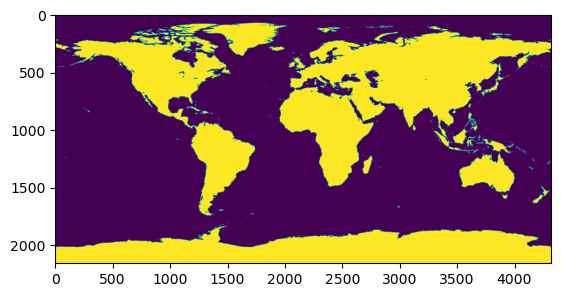

In [7]:
plt.imshow(land_map)

In [3]:
module_path = Path().resolve().parents[1] / "src" / "postprocessing"

# Append the directory to sys.path
sys.path.append(str(module_path))


from visualizePredictionMap import *
import cmcrameri as cmc


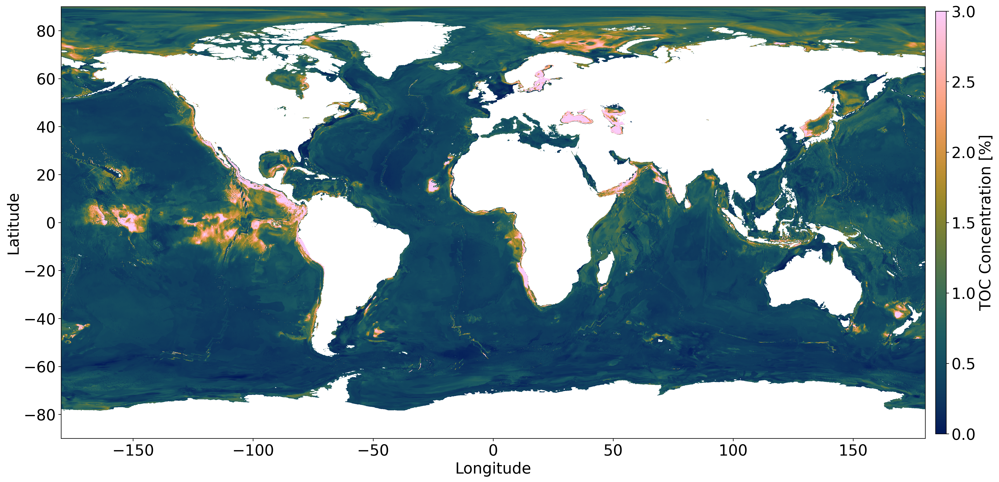

In [8]:
prediction_map2[land_map] = np.nan
VisualiseMap(prediction_map2, cmap = cmc.cm.batlow, use_log_norm=False, vmin=0, vmax=3, cbar_label="TOC Concentration [%]", 
                 lat_range=None, lon_range=None)

In [ ]:
np.save(Path().resolve().parents[1] / "data" / "output" / "predictionmaps_TOC" / "prediction_map_TOC_entire.npy", prediction_map2)